In [1]:
import pytorch_lightning as pl
from pytorch_lightning import Trainer, loggers
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn.functional as F
from torch.optim.lr_scheduler import StepLR

from transformer_lens import HookedTransformer, HookedTransformerConfig, utils
from pathlib import Path
from pytorch_lightning.loggers import TensorBoardLogger
import os

from scipy.linalg import norm
from transformer_lens import HookedTransformer, HookedTransformerConfig, utils
import torch
import numpy as np
import plotly.express as px
import plotly.io as pio
from jaxtyping import Float, Int # Read about this library
import tqdm.auto as tqdm
import einops
from transformer_lens.utils import to_numpy
from pathlib import Path
from torch.utils.data import TensorDataset, DataLoader
from datetime import datetime
# import pytorch_lightning as pl
from functools import partial
import pandas as pd

from transformer_lens.hook_points import (
    HookedRootModule,
    HookPoint,
)  # Hooking utilities

# Utils
def line(tensor, line_labels=None, yaxis="", xaxis="", title="", legend_title="", **kwargs):
    tensor = to_numpy(tensor)
    # Use Plotly's white template and enforce a clean layout
    fig = px.line(tensor, template="plotly_white", **kwargs)
    
    # Update layout with enhanced aesthetics
    fig.update_layout(
        title=dict(text=title, font=dict(size=24, family="Serif")),
        xaxis=dict(title=xaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        yaxis=dict(title=yaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        legend=dict(title=legend_title, font=dict(size=16)),
        width=800,
        height=500,
        margin=dict(l=50, r=50, t=80, b=50)
    )
    
    # Increase default line width and set marker styles
    for trace in fig.data:
        trace.line.width = 3
        trace.marker = dict(symbol="circle", size=8)
    
    # Apply line labels if provided
    if line_labels:
        for c, label in enumerate(line_labels):
            fig.data[c].name = label
    
    fig.show()


def imshow(tensor, yaxis="", xaxis="", **kwargs):
    tensor = to_numpy(tensor)
    # Use a high-quality continuous color scale and a white template
    plot_kwargs = {
        "color_continuous_scale": "RdBu_r",
        "color_continuous_midpoint": 0.0,
        "labels": {"x": xaxis, "y": yaxis},
        "template": "plotly_white",
        "aspect": "equal"
    }
    plot_kwargs.update(kwargs)
    fig = px.imshow(tensor, **plot_kwargs)
    fig.update_layout(
        title=dict(text="Image", font=dict(size=24, family="Serif")),
        xaxis=dict(title=xaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        yaxis=dict(title=yaxis, title_font=dict(size=18), tickfont=dict(size=16)),
        width=800,
        height=600,
        margin=dict(l=50, r=50, t=80, b=50)
    )
    fig.show()

# Load trained model

In [2]:
device='cpu'
def deactivate_position(model):
    model.pos_embed.W_pos.data[:] = 0.0
    model.pos_embed.W_pos.requires_grad = False

def freeze_embeddings(model):
    model.embed.W_E.requires_grad = False

def freeze_attention(model, l=0):
    model.blocks[l].attn.W_Q.requires_grad = False
    model.blocks[l].attn.W_K.requires_grad = False
    model.blocks[l].attn.W_V.requires_grad = False
    model.blocks[l].attn.W_O.requires_grad = False

    model.blocks[l].attn.b_Q.requires_grad = False
    model.blocks[l].attn.b_K.requires_grad = False
    model.blocks[l].attn.b_V.requires_grad = False
    model.blocks[l].attn.b_O.requires_grad = False


class LitTransformer(pl.LightningModule):
    def __init__(self, config, train_dataloader, val_dataloader):
        super().__init__()
        self.model = HookedTransformer(config)
        self.model.to(device)
        deactivate_position(self.model)
        freeze_embeddings(self.model)
        freeze_attention(self.model, l=0)
        # print(self.model.pos_embed.W_pos.data)
        # print(self.model.blocks[0].attn.W_Q.data)
        # print(self.model.W_E.device)
        self._train_dataloader = train_dataloader
        self._val_dataloader = val_dataloader

    def forward(self, tokens):
        return self.model(tokens.to(device))

    def training_step(self, batch, batch_idx):
        tokens, targets = batch
        tokens = tokens.to(device)
        targets = targets .to(device)
        logits = self(tokens)
        loss = self.loss_fn(logits, targets)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        tokens, targets = batch
        logits = self(tokens)
        loss = self.loss_fn(logits, targets)
        self.log('val_loss', loss)

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=5e-5, betas=(0.9, 0.95), weight_decay=0.1)
        scheduler = StepLR(optimizer, step_size=100, gamma=0.1)
        return [optimizer], [scheduler]

    def train_dataloader(self):
        return self._train_dataloader

    def val_dataloader(self):
        return self._val_dataloader

    def loss_fn(self, logits, labels, per_token=False):
        log_probs = logits.log_softmax(-1)
        correct_log_probs = log_probs.gather(-1, labels[..., None])[..., 0]
        if per_token:
            return -correct_log_probs
        else:
            return -correct_log_probs.mean()
################ Data
class CustomDataset(TensorDataset):
    def __init__(self, tokens, targets):
        super().__init__(tokens, targets)
BASE = Path('.').resolve() 
N_CTX = 64
TRAIN_RATIO = 0.8
TBLOGSDIR = f'tblogs'
D_VOCAB = 1_024
D_MODEL = 2048
N_SAMPLES = D_VOCAB*30
BATCH_SIZE = N_SAMPLES 
EMB_STD = 0.025

train_dataset = torch.randint(low=0, high=D_VOCAB, size=(N_SAMPLES, N_CTX), device=device)
test_dataset = torch.randint(low=0, high=D_VOCAB, size=(N_SAMPLES, N_CTX), device=device)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)

################ Data
cfg = HookedTransformerConfig(
    n_layers=1,
    d_model=D_MODEL,
    d_head=D_MODEL,
    n_heads=1,
    d_mlp=D_MODEL*4,
    d_vocab=D_VOCAB,
    n_ctx=N_CTX,
    act_fn='relu',
    normalization_type='LNPre',
    device=device,
    use_hook_mlp_in=True
)
def update_embedding(x):
    import torch.nn as nn
    std = np.sqrt(1.0 / (x.shape[1]))
    return nn.init.normal_(x, mean=0.0, std=std)

lit_model = LitTransformer(cfg, train_loader, test_loader)
lit_model.to(device)
model = lit_model.model
train_logits, train_cache = model.run_with_cache(train_loader.dataset)
test_logits, test_cache = model.run_with_cache(test_loader.dataset[:100])

Moving model to device:  cpu


# D_VOCAB = 1_024

In [3]:
model.embed.W_E.data.std(), model.blocks[0].attn.W_Q.data.std()

(tensor(0.0177), tensor(0.0177))

In [ ]:
# update_embedding(model.embed.W_E)

Parameter containing:
tensor([[ 0.0309,  0.0300, -0.0018,  ..., -0.0454,  0.0119,  0.0153],
        [-0.0228,  0.0335, -0.0261,  ...,  0.0156,  0.0157,  0.0011],
        [-0.0158, -0.0331,  0.0108,  ...,  0.0048,  0.0204,  0.0117],
        ...,
        [-0.0168, -0.0139,  0.0162,  ...,  0.0528, -0.0059, -0.0117],
        [-0.0107,  0.0052,  0.0243,  ..., -0.0397, -0.0304,  0.0226],
        [ 0.0111, -0.0423, -0.0345,  ..., -0.0210, -0.0014, -0.0147]])

In [4]:
model.embed.W_E.data.std(), model.blocks[0].attn.W_Q.data.std()


(tensor(0.0177), tensor(0.0177))

In [5]:
# L0
n_layers = 1
for layer_id in range(n_layers):
    # Heads
    for i in range(cfg.n_heads):
        imshow(
            (np.exp(train_cache[f"blocks.{layer_id}.attn.hook_attn_scores"][:, i, :, :].mean([0]).cpu().numpy())),
            title=f"Layer {layer_id} Attention Scores{i}",
            height=500,
            width=500,
        )

In [6]:
# L0
n_layers = 1
for layer_id in range(n_layers):
    # Heads
    for i in range(cfg.n_heads):
        imshow(
            to_numpy(train_cache["attn", layer_id][:, [i], :, :].mean([0, 1])),
            title=f"Layer {layer_id} Attention Pattern {i}",
            height=500,
            width=500,
        )

In [7]:
line(train_cache['blocks.0.ln2.hook_normalized'].mean(0)[:,:100])

In [ ]:
neurons_avg_across_pos = train_cache['blocks.0.ln2.hook_normalized'].mean(0) # 64 x 2048
# Let's find 10 neurons that are the closest to each other and also positive
neurons_mean = neurons_avg_across_pos.mean(0)
q = np.quantile(neurons_mean, 0.75)
# top_quarter_neurons_ids = np.where(neurons_mean > q)[0]
line(neurons_avg_across_pos[:, top_quarter_neurons_ids], title='Top 25% neurons', xaxis='Position', yaxis='Neuron value', width=800, height=500)

In [ ]:
print(regressors[0].coefficients)

In [11]:
avg_line_for_upper_quarter = neurons_avg_across_pos[:, top_quarter_neurons_ids].mean(1)
line(avg_line_for_upper_quarter, title='Average line for upper quarter neurons', xaxis='Position', yaxis='Activation', color_discrete_sequence=['blue'])

# Use top 25% of positive neurons as a label

## 30K samples

Number of neurons used to create Y: 103
Activations shape: (30720, 64, 2048)


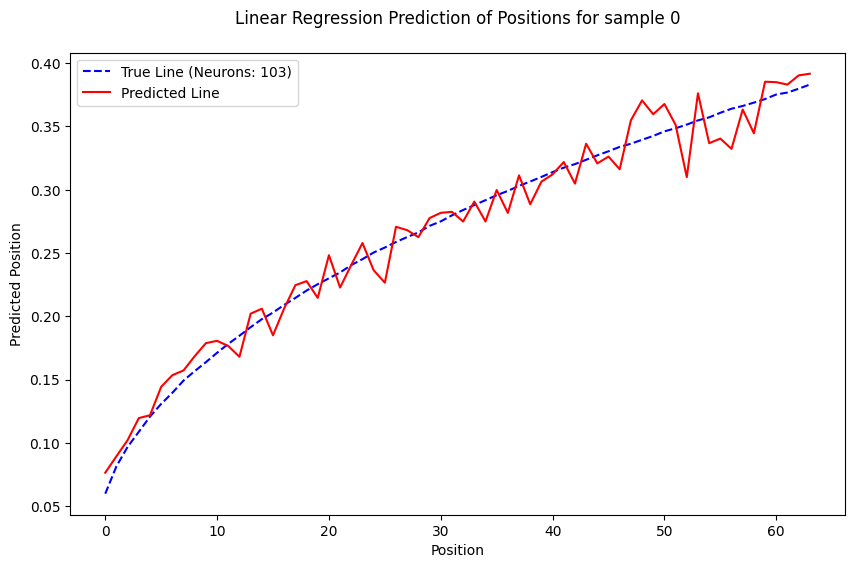

Number of neurons used to create Y: 205
Activations shape: (30720, 64, 2048)


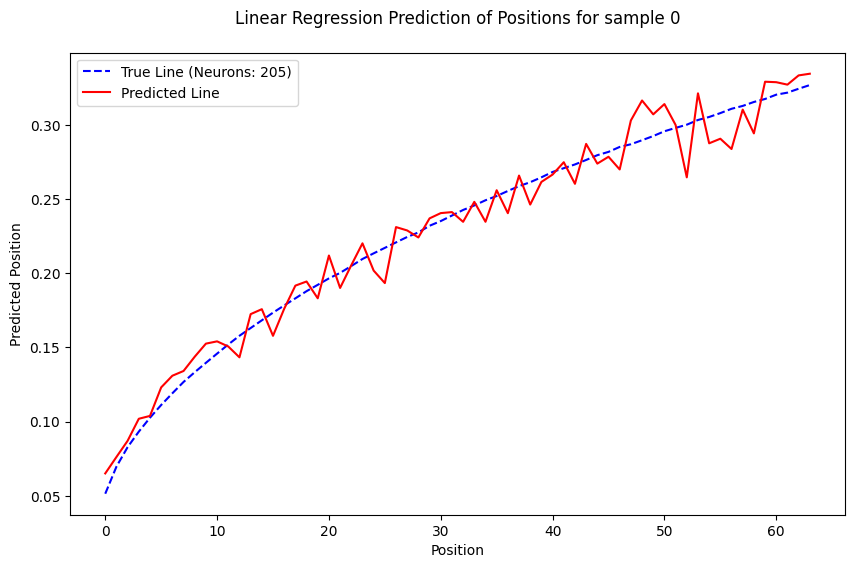

Number of neurons used to create Y: 308
Activations shape: (30720, 64, 2048)


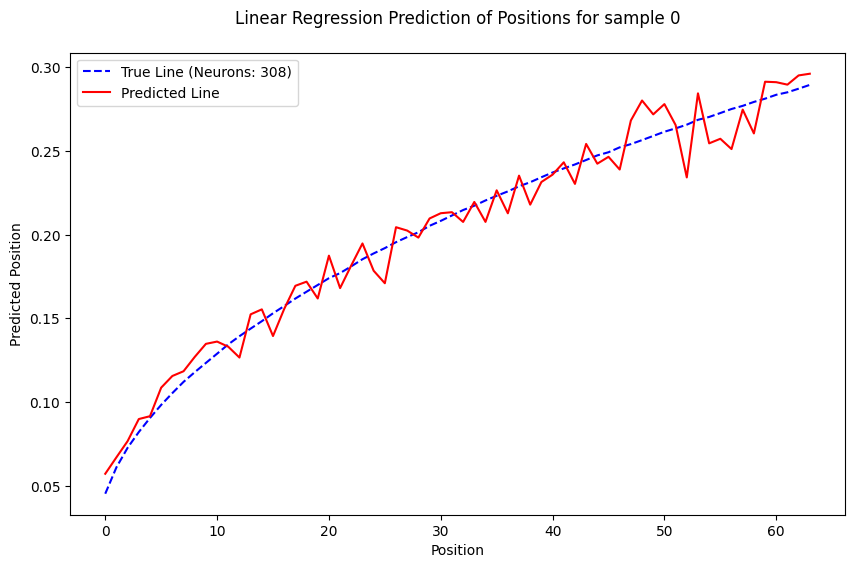

Number of neurons used to create Y: 410
Activations shape: (30720, 64, 2048)


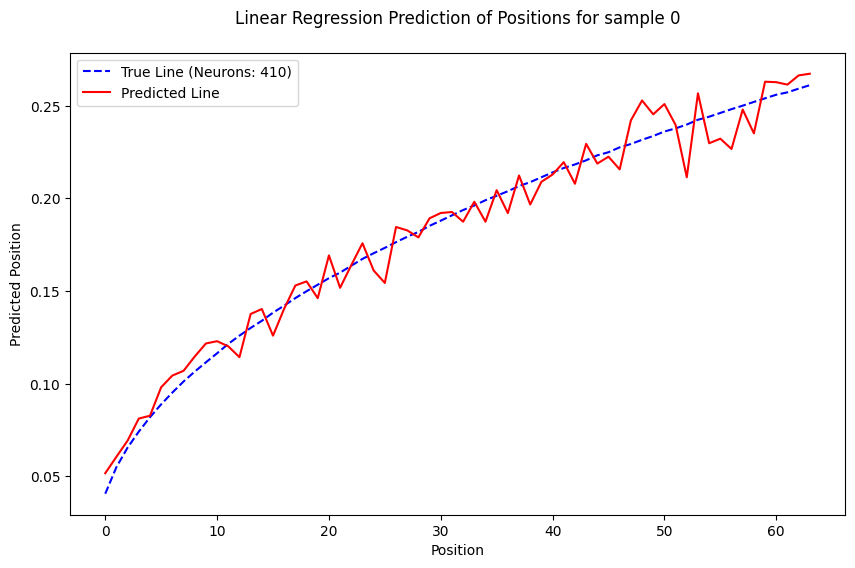

Number of neurons used to create Y: 512
Activations shape: (30720, 64, 2048)


KeyboardInterrupt: 

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y
def get_y(test_cache, q=0.9, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # Move to GPU
    neurons_mean = neurons_avg_across_pos.mean(0)
    q = np.quantile(neurons_mean.cpu().numpy(), q)  # Move to CPU for numpy operations
    top_quarter_neurons_ids = np.where(neurons_mean.cpu().numpy() > q)[0]
    
    # Print the number of neurons used to create Y
    print(f"Number of neurons used to create Y: {len(top_quarter_neurons_ids)}")
    
    if draw_line:
        line(neurons_avg_across_pos[:, top_quarter_neurons_ids].cpu().numpy())  # Move to CPU for plotting
    avg_line_for_upper_quarter = neurons_avg_across_pos[:, top_quarter_neurons_ids].mean(1)
    return avg_line_for_upper_quarter.cpu().numpy(), len(top_quarter_neurons_ids)  # Return Y and number of neurons

# Build X
def regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = train_cache[act].to(device)  # Move to GPU
    activations = activations.cpu().numpy()  # Move to CPU for sklearn compatibility

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Train a linear regressor for each sample
    Y_sample = mean_curve.reshape(-1,1)  # Target line [64, 1]
    regressor = LinearRegression()

    selected_activations = activations[:, :, :]
    Y = np.tile(Y_sample, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)
    regressor.fit(selected_activations.reshape(-1, n_neurons), Y)
    # Predict the positions using the trained model
    for i in [0]:
        # Extract activations for the selected neurons
        selected_activations = test_cache[act][i].to(device)  # Move to GPU
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())  # Move to CPU for prediction
        # Plot the true positions vs. predicted positions for the first sample
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label=f'True Line (Neurons: {num_neurons})', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()

        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_q={q}_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()

        plt.close()
    return regressor

regressors = []
for q in [0.95, 0.9, 0.85, 0.8, 0.75, 0.7]:
    mean_curve, num_neurons = get_y(train_cache, q=q, layer='blocks.0.ln2.hook_normalized', draw_line=False)
    regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="activation_plots")
    regressors.append(regressor)

## 10K samples

Number of neurons used to create Y: 103
Activations shape: (10240, 64, 2048)


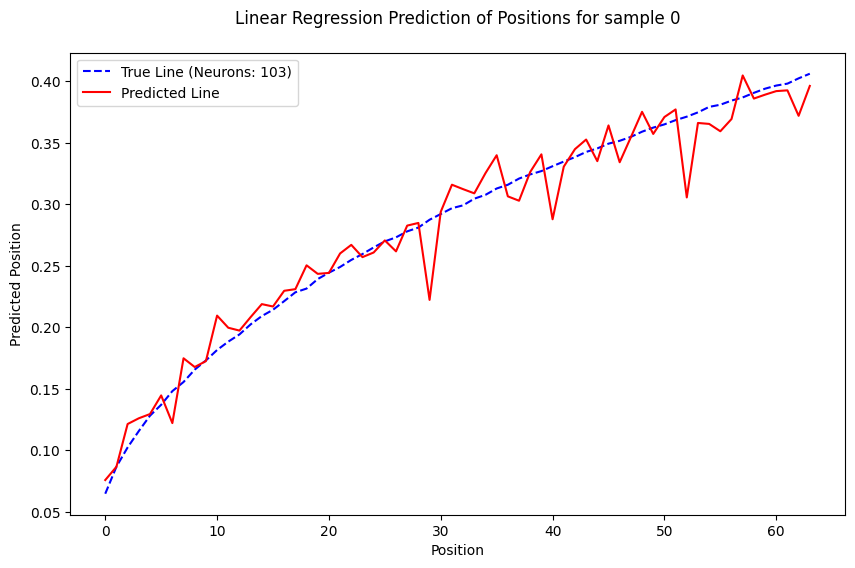

Number of neurons used to create Y: 205
Activations shape: (10240, 64, 2048)


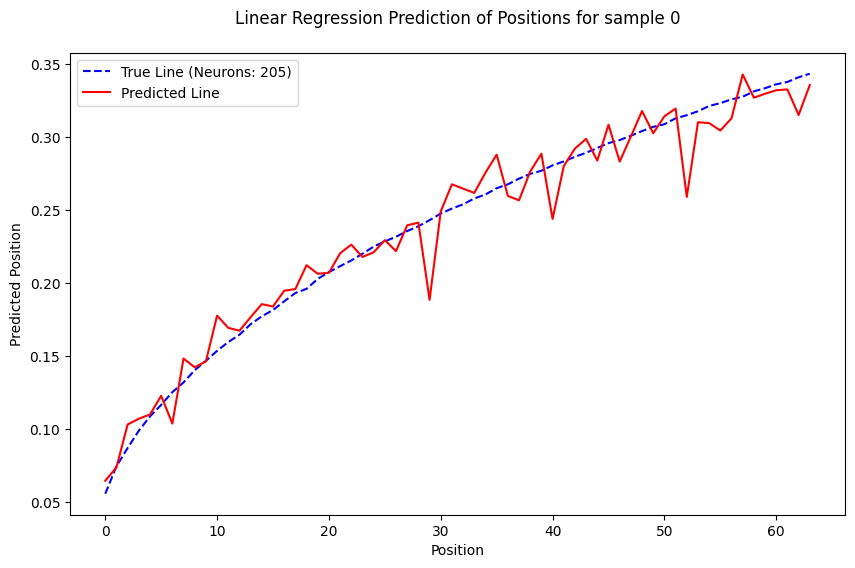

Number of neurons used to create Y: 308
Activations shape: (10240, 64, 2048)


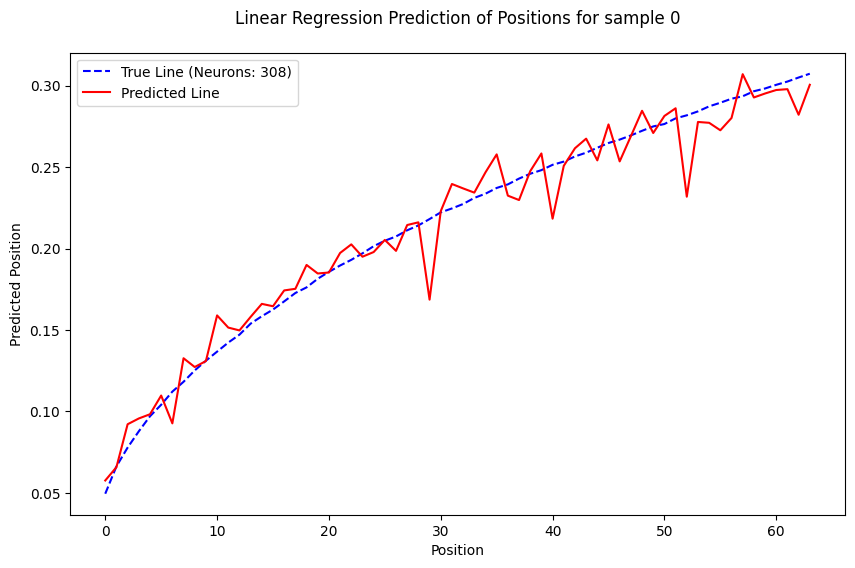

Number of neurons used to create Y: 410
Activations shape: (10240, 64, 2048)


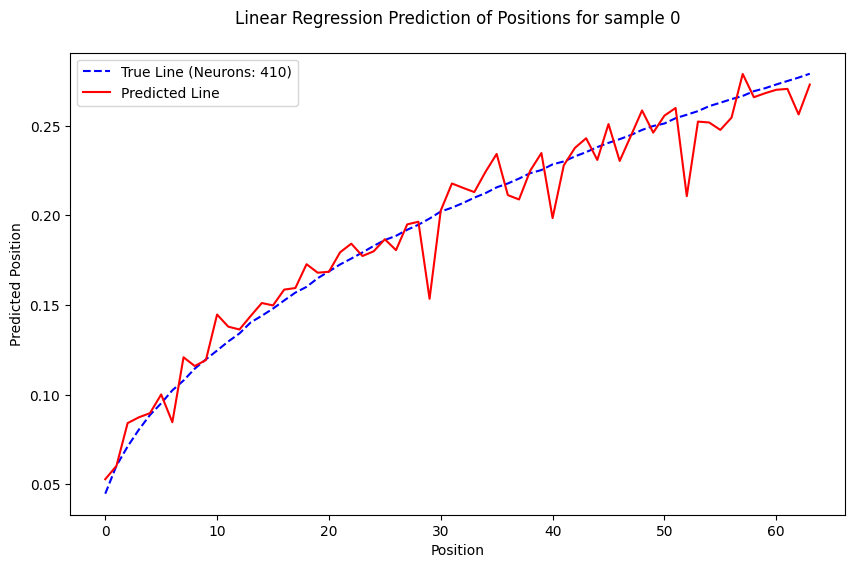

Number of neurons used to create Y: 512
Activations shape: (10240, 64, 2048)


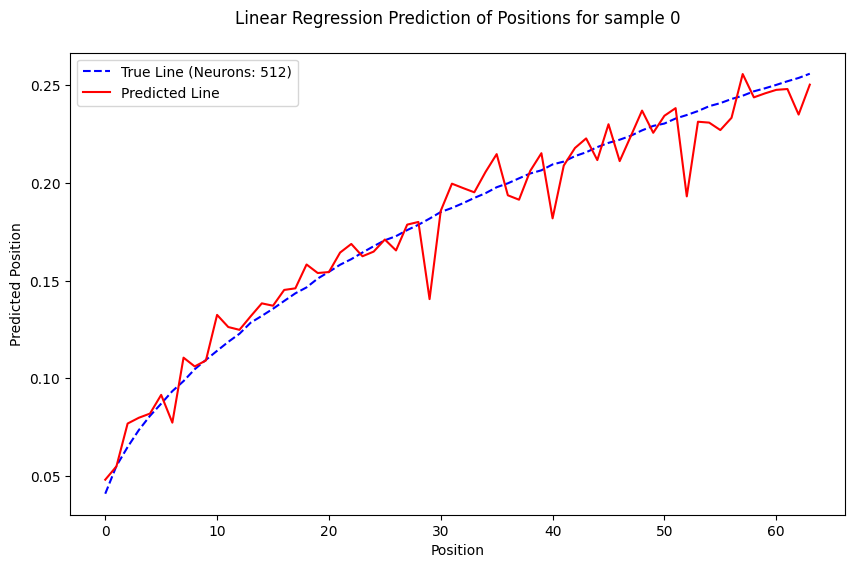

Number of neurons used to create Y: 615
Activations shape: (10240, 64, 2048)


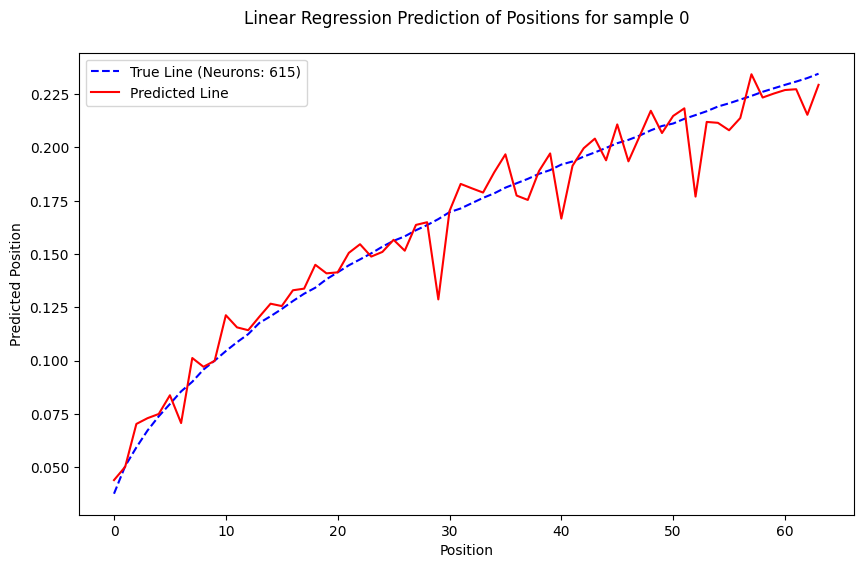

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y
def get_y(test_cache, q=0.9, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # Move to GPU
    neurons_mean = neurons_avg_across_pos.mean(0)
    q = np.quantile(neurons_mean.cpu().numpy(), q)  # Move to CPU for numpy operations
    top_quarter_neurons_ids = np.where(neurons_mean.cpu().numpy() > q)[0]
    
    # Print the number of neurons used to create Y
    print(f"Number of neurons used to create Y: {len(top_quarter_neurons_ids)}")
    
    if draw_line:
        line(neurons_avg_across_pos[:, top_quarter_neurons_ids].cpu().numpy())  # Move to CPU for plotting
    avg_line_for_upper_quarter = neurons_avg_across_pos[:, top_quarter_neurons_ids].mean(1)
    return avg_line_for_upper_quarter.cpu().numpy(), len(top_quarter_neurons_ids)  # Return Y and number of neurons

# Build X
def regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = train_cache[act].to(device)  # Move to GPU
    activations = activations.cpu().numpy()  # Move to CPU for sklearn compatibility

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Train a linear regressor for each sample
    Y_sample = mean_curve.reshape(-1,1)  # Target line [64, 1]
    regressor = LinearRegression()

    selected_activations = activations[:, :, :]
    Y = np.tile(Y_sample, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)
    regressor.fit(selected_activations.reshape(-1, n_neurons), Y)
    # Predict the positions using the trained model
    for i in [0]:
        # Extract activations for the selected neurons
        selected_activations = test_cache[act][i].to(device)  # Move to GPU
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())  # Move to CPU for prediction
        # Plot the true positions vs. predicted positions for the first sample
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label=f'True Line (Neurons: {num_neurons})', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()

        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_q={q}_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()

        plt.close()
    return regressor

regressors = []
for q in [0.95, 0.9, 0.85, 0.8, 0.75, 0.7]:
    mean_curve, num_neurons = get_y(train_cache, q=q, layer='blocks.0.ln2.hook_normalized', draw_line=False)
    regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="activation_plots")
    regressors.append(regressor)

In [6]:

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y
def get_y(test_cache, q=0.9, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # Move to GPU
    neurons_mean = neurons_avg_across_pos.mean(0)
    q = np.quantile(neurons_mean.cpu().numpy(), q)  # Move to CPU for numpy operations
    top_quarter_neurons_ids = np.where(neurons_mean.cpu().numpy() > q)[0]
    
    # Print the number of neurons used to create Y
    print(f"Number of neurons used to create Y: {len(top_quarter_neurons_ids)}")
    
    if draw_line:
        line(neurons_avg_across_pos[:, top_quarter_neurons_ids].cpu().numpy())  # Move to CPU for plotting
    avg_line_for_upper_quarter = neurons_avg_across_pos[:, top_quarter_neurons_ids].mean(1)
    return avg_line_for_upper_quarter.cpu().numpy(), len(top_quarter_neurons_ids)  # Return Y and number of neurons

# Build X
def regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = train_cache[act].to(device)  # Move to GPU
    activations = activations.cpu().numpy()  # Move to CPU for sklearn compatibility

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Train a linear regressor for each sample
    Y_sample = mean_curve.reshape(-1,1)  # Target line [64, 1]
    regressor = LinearRegression()

    selected_activations = activations[:, :, :]
    Y = np.tile(Y_sample, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)
    regressor.fit(selected_activations.reshape(-1, n_neurons), Y)
    # Predict the positions using the trained model
    for i in [0]:
        # Extract activations for the selected neurons
        selected_activations = test_cache[act][i].to(device)  # Move to GPU
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())  # Move to CPU for prediction
        # Plot the true positions vs. predicted positions for the first sample
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label=f'True Line (Neurons: {num_neurons})', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()

        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_q={q}_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()

        plt.close()
    return regressor



# More repetitions in each sentence (smaller vocab)
# VOCAB = 32

In [ ]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from tqdm import tqdm

D_VOCAB = int(N_CTX / 2)
device='cpu'
print(f"Vocab size: {D_VOCAB}")
cfg = HookedTransformerConfig(
    n_layers=1,
    d_model=D_MODEL,
    d_head=D_MODEL,
    n_heads=1,
    d_mlp=D_MODEL*4,
    d_vocab=D_VOCAB,
    n_ctx=N_CTX,
    act_fn='relu',
    normalization_type='LNPre',
    device=device,
    use_hook_mlp_in=True
)
train_dataset = torch.randint(low=0, high=D_VOCAB, size=(N_SAMPLES, N_CTX), device=device)
test_dataset = torch.randint(low=0, high=D_VOCAB, size=(N_SAMPLES, N_CTX), device=device)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
lit_model = LitTransformer(cfg, train_loader, test_loader)
lit_model.to(device)
try:
    del train_cache, test_cache
    del model
    torch.cuda.empty_cache()
except:
    pass
model = lit_model.model
train_logits, train_cache = model.run_with_cache(train_loader.dataset)
test_logits, test_cache = model.run_with_cache(test_loader.dataset[:100])

Vocab size: 32
Moving model to device:  cpu


In [ ]:
line(train_cache['blocks.0.ln2.hook_normalized'].mean(0)[:,:100])

In [ ]:
regressors = []
for q in [0.95]:
    mean_curve, num_neurons = get_y(train_cache, q=q, layer='blocks.0.ln2.hook_normalized', draw_line=False)
    regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="activation_plots")
    regressors.append(regressor)

Number of neurons used to create Y: 103
Activations shape: (30720, 64, 2048)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from sklearn.linear_model import LinearRegression
from tqdm import tqdm
from itertools import combinations

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y
def get_y(test_cache, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # Move to GPU
    neurons_mean = neurons_avg_across_pos.mean(0).cpu().numpy()  # Move to CPU for numpy operations

    # Calculate pairwise distances between neurons
    pairwise_distances = np.linalg.norm(neurons_avg_across_pos.cpu().numpy()[:, :, None] - neurons_avg_across_pos.cpu().numpy()[:, None, :], axis=0)

    # Find the group of 10 neurons with the smallest average pairwise distance
    n_neurons = neurons_avg_across_pos.shape[1]
    best_group = None
    best_distance = float('inf')
    for group in combinations(range(n_neurons), 10):
        avg_distance = np.mean(pairwise_distances[np.ix_(group, group)])
        if avg_distance < best_distance:
            best_distance = avg_distance
            best_group = group

    # Use the selected group of neurons to calculate Y
    top_neurons_ids = list(best_group)
    print(f"Selected neurons for Y: {top_neurons_ids}")
    if draw_line:
        line(neurons_avg_across_pos[:, top_neurons_ids].cpu().numpy())  # Move to CPU for plotting
    avg_line_for_selected_neurons = neurons_avg_across_pos[:, top_neurons_ids].mean(1)
    return avg_line_for_selected_neurons.cpu().numpy(), len(top_neurons_ids)  # Return Y and number of neurons

# Build X
def regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = train_cache[act].to(device)  # Move to GPU
    activations = activations.cpu().numpy()  # Move to CPU for sklearn compatibility

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Train a linear regressor for each sample
    Y_sample = mean_curve.reshape(-1,1)  # Target line [64, 1]
    regressor = LinearRegression()

    selected_activations = activations[:, :, :]
    Y = np.tile(Y_sample, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)
    regressor.fit(selected_activations.reshape(-1, n_neurons), Y)
    # Predict the positions using the trained model
    for i in [0]:
        # Extract activations for the selected neurons
        selected_activations = test_cache[act][i].to(device)  # Move to GPU
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())  # Move to CPU for prediction
        # Plot the true positions vs. predicted positions for the first sample
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label=f'True Line (Neurons: {num_neurons})', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()

        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()

        plt.close()
    return regressor

# Example call:
regressors = []
for layer in ['blocks.0.ln2.hook_normalized']:
    mean_curve, num_neurons = get_y(train_cache, layer=layer, draw_line=False)
    regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act=layer, save_to_disk=False, output_dir="activation_plots")
    regressors.append(regressor)

KeyboardInterrupt: 

# Calculate the closest set of 100 Neurons in terms of MAE

Uniformly sampling neuron groups: 100%|█████████| 1000000/1000000 [01:37<00:00, 10295.06it/s]


Selected neurons for Y: [4, 10, 20, 53, 65, 74, 78, 113, 120, 137, 147, 152, 173, 181, 182, 183, 185, 187, 201, 218, 223, 227, 239, 250, 273, 283, 289, 293, 318, 333, 334, 338, 342, 351, 387, 389, 397, 401, 416, 419, 421, 425, 427, 432, 445, 446, 453, 463, 465, 480, 487, 494, 502, 532, 539, 547, 552, 558, 561, 583, 599, 604, 611, 612, 614, 627, 639, 647, 648, 672, 678, 681, 683, 707, 733, 739, 745, 764, 769, 772, 796, 805, 817, 853, 872, 874, 879, 890, 893, 944, 946, 953, 968, 973, 995, 999, 1003, 1004, 1013, 1014]
Activations shape: (10240, 64, 2048)


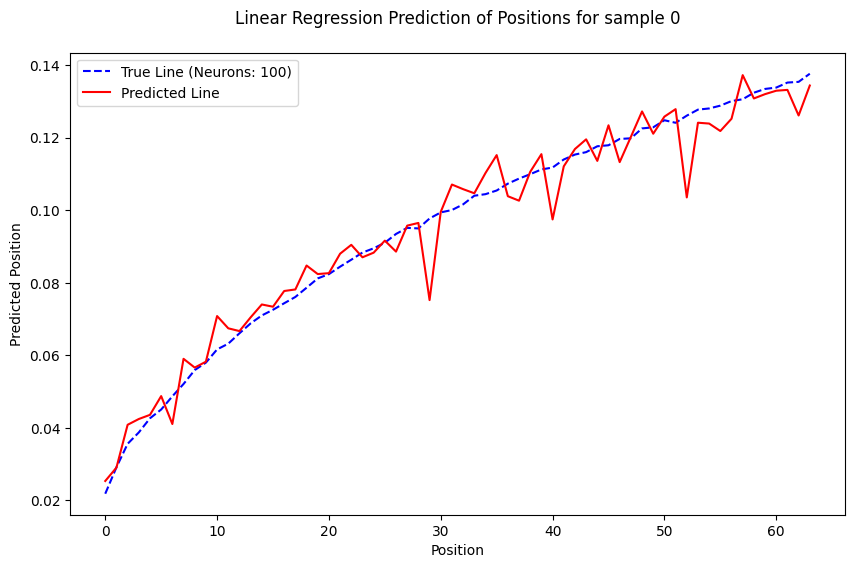

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from sklearn.linear_model import LinearRegression
from tqdm import tqdm
from itertools import combinations

N_NEURONS_FOR_Y_CALC = 200
# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y: using average over samples then selecting 10 neurons with minimal average MAE
def get_y(test_cache, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    # Average over samples: result shape [pos, neurons]
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # [pos, neurons]
    neurons_avg_across_pos_cpu = neurons_avg_across_pos.cpu().numpy()  # shape [pos, n_neurons]
    # Filter out neurons whose mean over positions is not positive.
    positive_mask = neurons_avg_across_pos_cpu.mean(axis=0) > 0
    neurons_avg_across_pos_cpu = neurons_avg_across_pos_cpu[:, positive_mask]
    if not neurons_avg_across_pos_cpu.shape[1]:
        raise ValueError("No neurons with positive average activation found.")
    
    pos, n_neurons = neurons_avg_across_pos_cpu.shape

    # Precompute the distance (MAE over positions) between each pair of neurons.
    # distance_matrix[i, j] = mean(|neurons_avg_across_pos[:, i] - neurons_avg_across_pos[:, j]|)
    distance_matrix = np.zeros((n_neurons, n_neurons))
    for i in range(n_neurons):
        for j in range(i+1, n_neurons):
            mae = np.mean(np.abs(neurons_avg_across_pos_cpu[:, i] - neurons_avg_across_pos_cpu[:, j]))
            distance_matrix[i, j] = mae

    # Find the combination of 10 neurons with minimal average pairwise MAE.
    best_group = None
    best_avg_mae = float('inf')
    max_iter = 1_000_000
    searched_groups = set()  # Track already seen groups
    for _ in tqdm(range(max_iter), desc="Uniformly sampling neuron groups"):
        group = tuple(sorted(random.sample(range(n_neurons), N_NEURONS_FOR_Y_CALC)))
        if group in searched_groups:
            continue
        searched_groups.add(group)
        submatrix = distance_matrix[np.ix_(group, group)]
        total_mae = submatrix.sum()
        if total_mae < best_avg_mae:
            best_avg_mae = total_mae
            best_group = group

    top_neurons_ids = list(best_group)
    print(f"Selected neurons for Y: {top_neurons_ids}")
    if draw_line:
        # Plot the activations for the selected neurons; shape [pos, 10]
        line(neurons_avg_across_pos_cpu[:, top_neurons_ids])
        plt.show()
    # Compute the average line (Y) over the chosen neurons (axis=1 gives [pos])
    avg_line_for_selected_neurons = neurons_avg_across_pos_cpu[:, top_neurons_ids].mean(axis=1)
    return avg_line_for_selected_neurons, len(top_neurons_ids)


# Build X remains the same (using the regressor to predict positions)
def regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, pos, neurons)
    activations = train_cache[act].to(device)
    activations = activations.cpu().numpy()

    num_samples, n_positions, n_neurons_total = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, pos) such that X shape is (num_samples * pos, n_neurons_total)
    X = activations.reshape(-1, n_neurons_total)
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Setup target Y_sample from our computed mean_curve (shape [pos,])
    Y_sample = mean_curve.reshape(-1, 1)
    regressor = LinearRegression()
    
    # Repeat Y_sample over samples to match X's first dimension:
    Y = np.tile(Y_sample, (num_samples, 1))
    regressor.fit(X, Y)
    
    # Predict on test set for first sample at least
    for i in [0]:
        selected_activations = test_cache[act][i].to(device)
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label=f'True Line (Neurons: {num_neurons})', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()
        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()
        plt.close()
    return regressor

# Example call:
regressors = []
mean_curve, num_neurons = get_y(train_cache, layer='blocks.0.ln2.hook_normalized', draw_line=False)
regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="activation_plots")
regressors.append(regressor)

# 1 sample to mean

Number of neurons used to create Y: 103
Activations shape: (10240, 64, 2048)


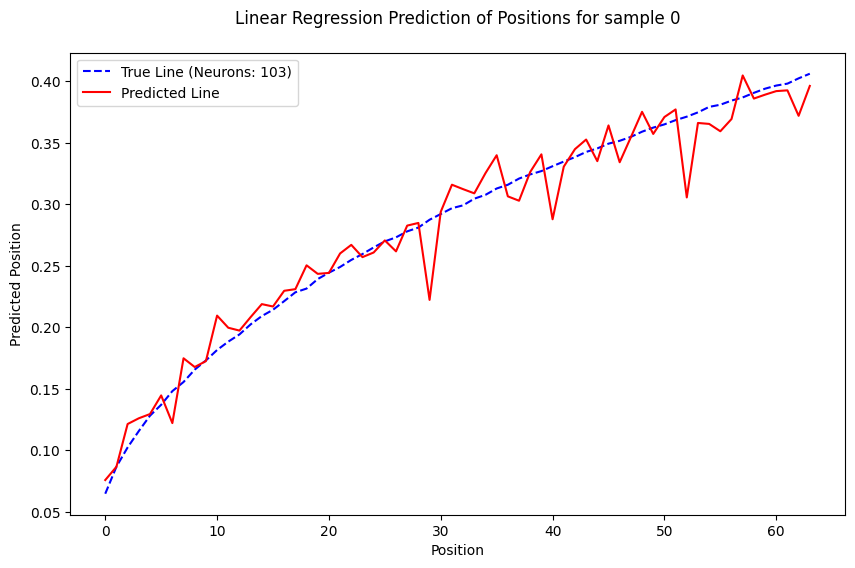

Number of neurons used to create Y: 205
Activations shape: (10240, 64, 2048)


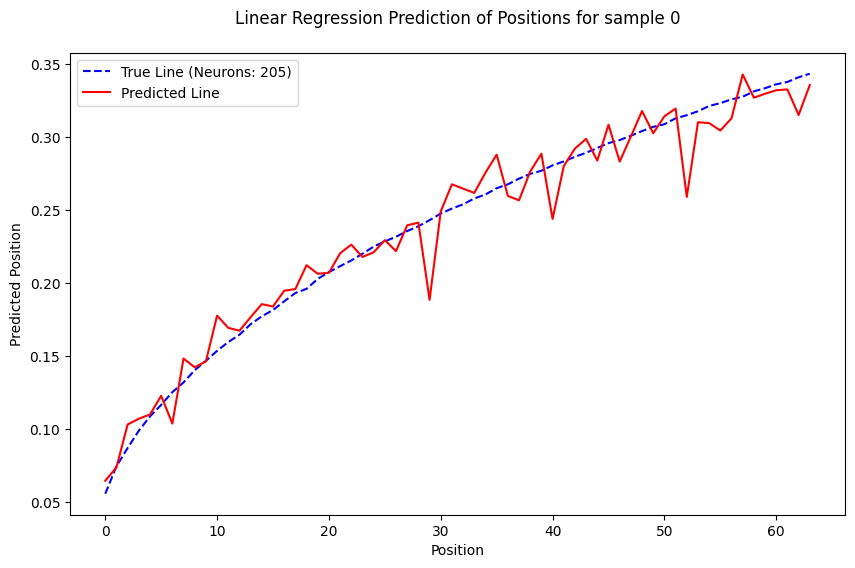

Number of neurons used to create Y: 308
Activations shape: (10240, 64, 2048)


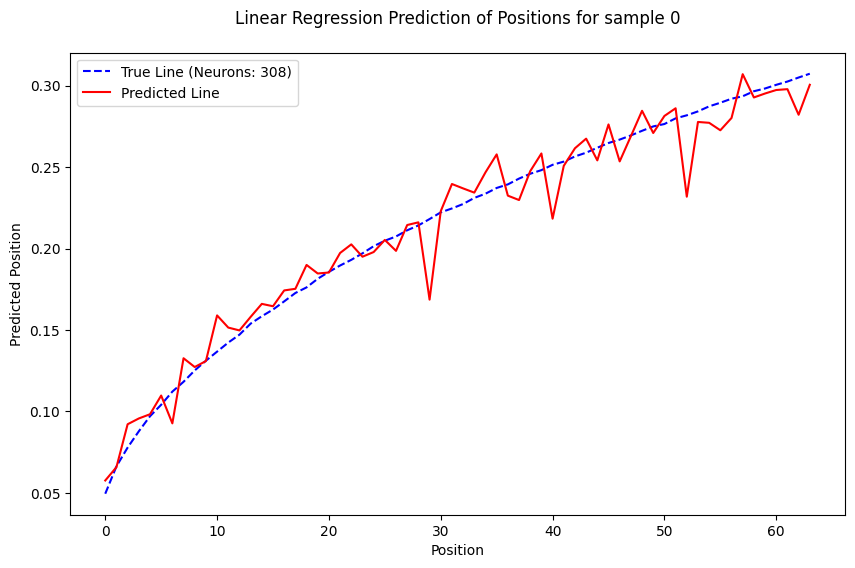

Number of neurons used to create Y: 410
Activations shape: (10240, 64, 2048)


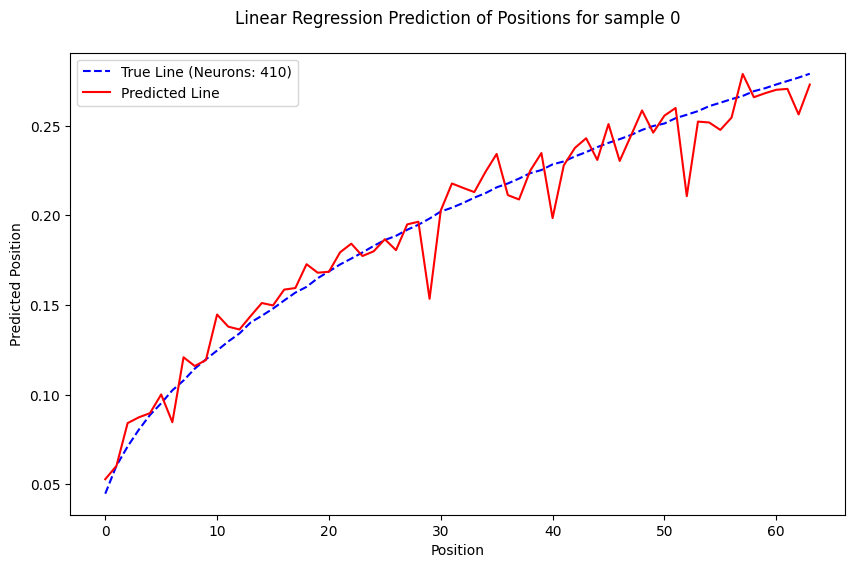

Number of neurons used to create Y: 512
Activations shape: (10240, 64, 2048)


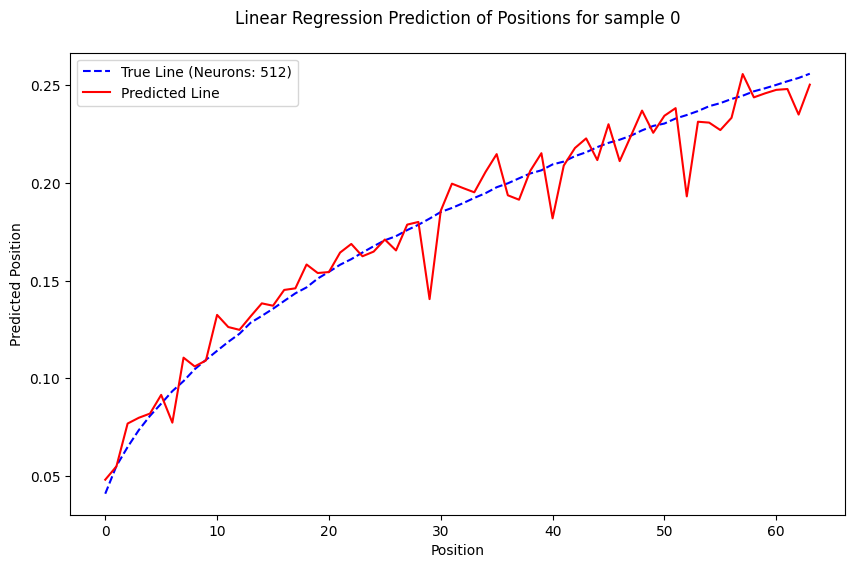

Number of neurons used to create Y: 615
Activations shape: (10240, 64, 2048)


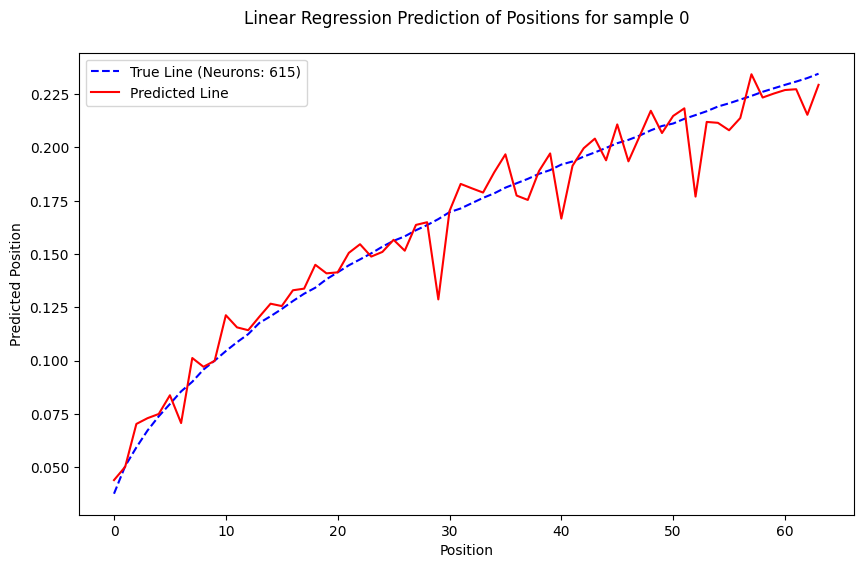

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y
def get_y(test_cache, q=0.9, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # Move to GPU
    neurons_mean = neurons_avg_across_pos.mean(0)
    q = np.quantile(neurons_mean.cpu().numpy(), q)  # Move to CPU for numpy operations
    top_quarter_neurons_ids = np.where(neurons_mean.cpu().numpy() > q)[0]
    
    # Print the number of neurons used to create Y
    print(f"Number of neurons used to create Y: {len(top_quarter_neurons_ids)}")
    
    if draw_line:
        line(neurons_avg_across_pos[:, top_quarter_neurons_ids].cpu().numpy())  # Move to CPU for plotting
    avg_line_for_upper_quarter = neurons_avg_across_pos[:, top_quarter_neurons_ids].mean(1)
    return avg_line_for_upper_quarter.cpu().numpy(), len(top_quarter_neurons_ids)  # Return Y and number of neurons

# Build X
def regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = train_cache[act].to(device)  # Move to GPU
    activations = activations.cpu().numpy()  # Move to CPU for sklearn compatibility

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Train a linear regressor for each sample
    Y_sample = mean_curve.reshape(-1,1)  # Target line [64, 1]
    regressor = LinearRegression()

    selected_activations = activations[:, :, :]
    Y = np.tile(Y_sample, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)
    regressor.fit(selected_activations.reshape(-1, n_neurons), Y)
    # Predict the positions using the trained model
    for i in [0]:
        # Extract activations for the selected neurons
        selected_activations = test_cache[act][i].to(device)  # Move to GPU
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())  # Move to CPU for prediction
        # Plot the true positions vs. predicted positions for the first sample
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label=f'True Line (Neurons: {num_neurons})', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()

        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_q={q}_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()

        plt.close()
    return regressor

# Example call:
regressors = []
for q in [0.95, 0.9, 0.85, 0.8, 0.75, 0.7]:
    mean_curve, num_neurons = get_y(train_cache, q=q, layer='blocks.0.ln2.hook_normalized', draw_line=False)
    regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, num_neurons, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="activation_plots")
    regressors.append(regressor)

Number of neurons used to create Y: 103
Activations shape: (10240, 64, 2048)


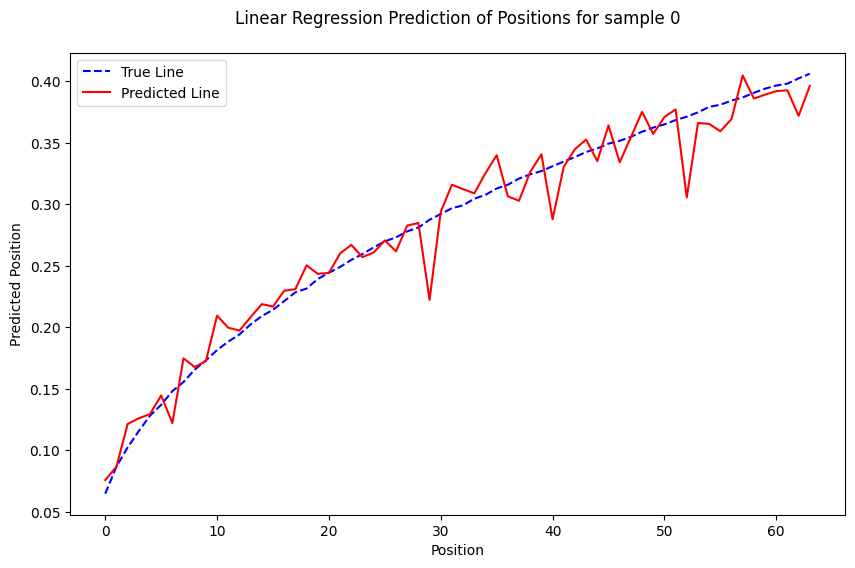

Number of neurons used to create Y: 205
Activations shape: (10240, 64, 2048)


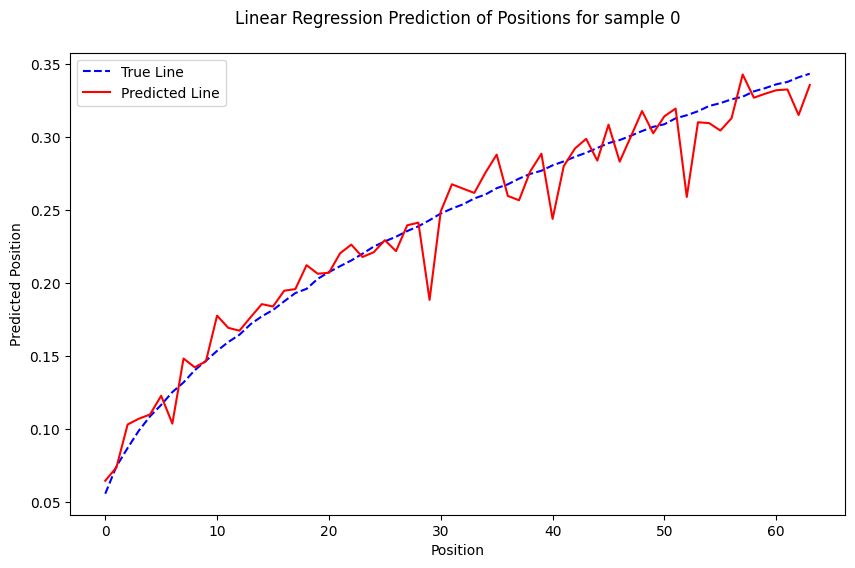

Number of neurons used to create Y: 308
Activations shape: (10240, 64, 2048)


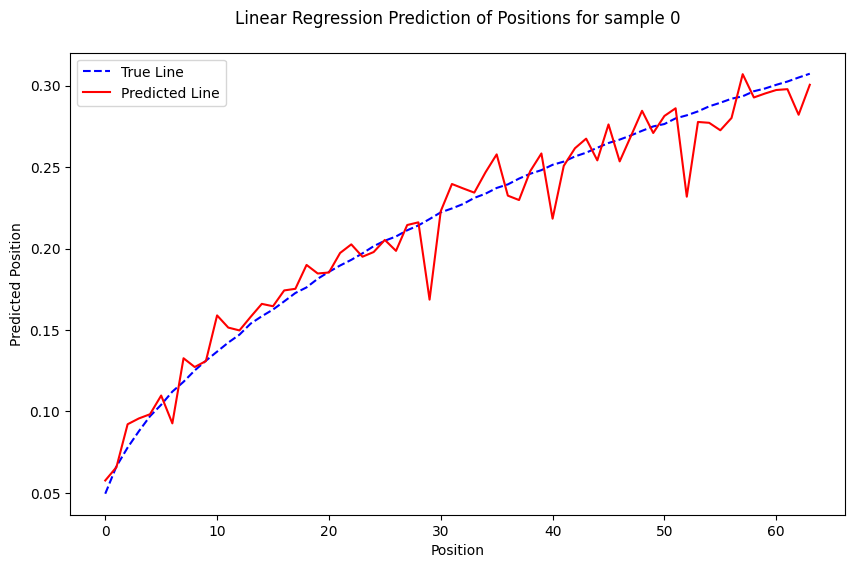

Number of neurons used to create Y: 410
Activations shape: (10240, 64, 2048)


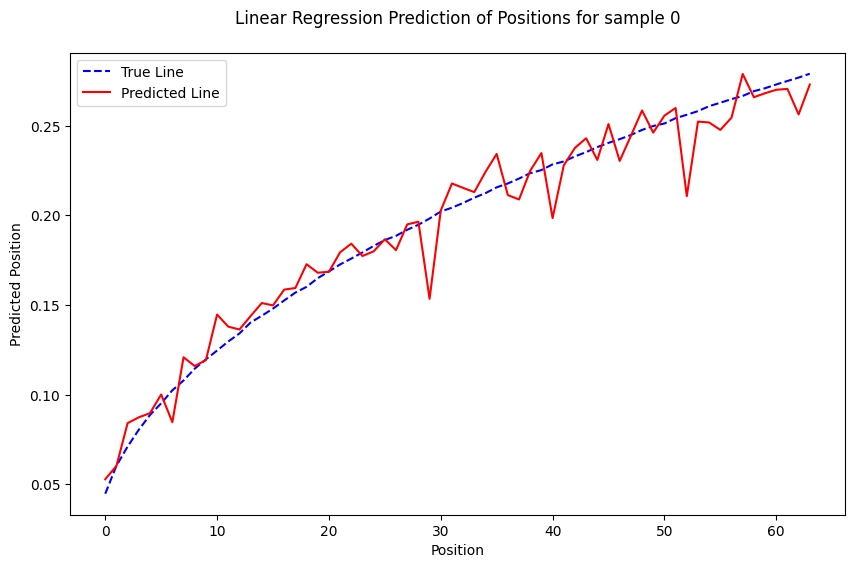

Number of neurons used to create Y: 512
Activations shape: (10240, 64, 2048)


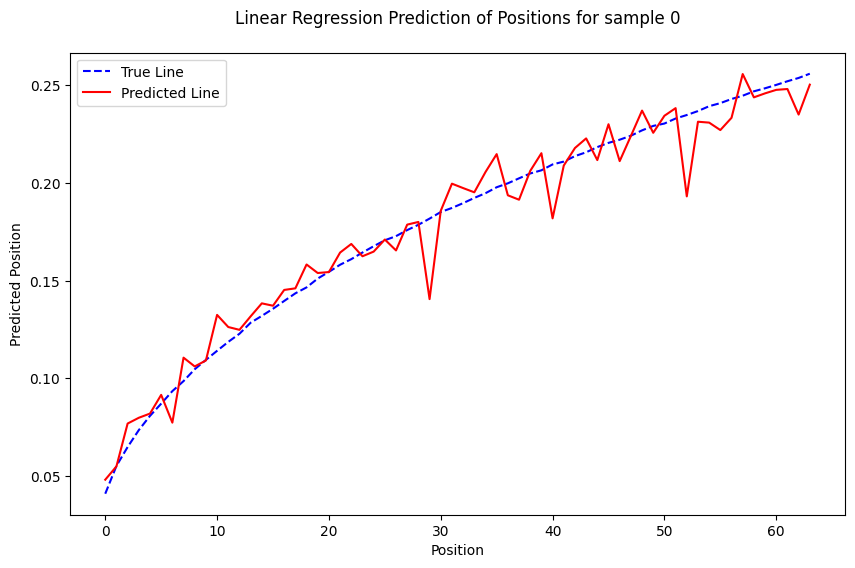

Number of neurons used to create Y: 615
Activations shape: (10240, 64, 2048)


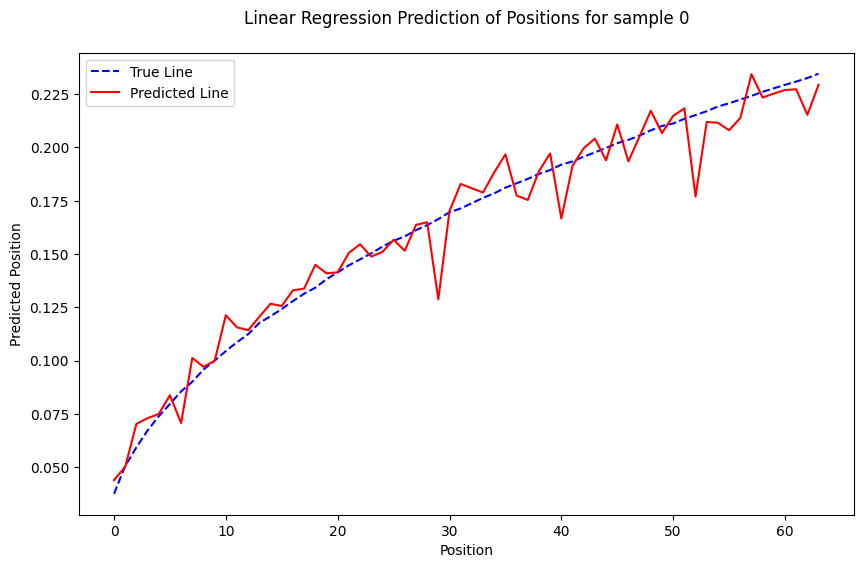

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Y
def get_y(test_cache, q=0.9, layer='blocks.0.ln2.hook_normalized', draw_line=True):
    neurons_avg_across_pos = train_cache[layer].mean(0).to(device)  # Move to GPU
    neurons_mean = neurons_avg_across_pos.mean(0)
    q = np.quantile(neurons_mean.cpu().numpy(), q)  # Move to CPU for numpy operations
    top_quarter_neurons_ids = np.where(neurons_mean.cpu().numpy() > q)[0]
    
    # Print the number of neurons used to create Y
    print(f"Number of neurons used to create Y: {len(top_quarter_neurons_ids)}")
    
    if draw_line:
        line(neurons_avg_across_pos[:, top_quarter_neurons_ids].cpu().numpy())  # Move to CPU for plotting
    avg_line_for_upper_quarter = neurons_avg_across_pos[:, top_quarter_neurons_ids].mean(1)
    return avg_line_for_upper_quarter.cpu().numpy()  # Return to CPU for further processing

# Build X
def regress_samples_to_mean(train_cache, test_cache, mean_curve, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = train_cache[act].to(device)  # Move to GPU
    activations = activations.cpu().numpy()  # Move to CPU for sklearn compatibility

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Train a linear regressor for each sample
    Y_sample = mean_curve.reshape(-1,1)  # Target line [64, 1]
    regressor = LinearRegression()

    selected_activations = activations[:, :, :]
    Y = np.tile(Y_sample, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)
    regressor.fit(selected_activations.reshape(-1, n_neurons), Y)
    # Predict the positions using the trained model
    for i in [0]:
        # Extract activations for the selected neurons
        selected_activations = test_cache[act][i].to(device)  # Move to GPU
        predicted_positions = regressor.predict(selected_activations.cpu().numpy())  # Move to CPU for prediction
        # Plot the true positions vs. predicted positions for the first sample
        plt.figure(figsize=(10, 6))
        plt.plot(range(n_positions), Y_sample, label='True Line', color='blue', linestyle='--')
        plt.plot(range(n_positions), predicted_positions, label='Predicted Line', color='red')
        plt.xlabel('Position')
        plt.ylabel('Predicted Position')
        plt.title(f'Linear Regression Prediction of Positions for sample {i}\n')
        plt.legend()

        if save_to_disk:
            plot_path = os.path.join(output_dir, f"linear_regression_q={q}_plot.png")
            plt.savefig(plot_path)
            print(f"Plot saved to {plot_path}")
        else:
            plt.show()

        plt.close()
    return regressor

# Example call:
regressors = []
for q in [0.95, 0.9, 0.85, 0.8, 0.75, 0.7]:
    mean_curve = get_y(train_cache, q=q, layer='blocks.0.ln2.hook_normalized', draw_line=False)
    regressor = regress_samples_to_mean(train_cache, test_cache, mean_curve, act='blocks.0.ln2.hook_normalized', save_to_disk=False, output_dir="activation_plots")
    regressors.append(regressor)

In [ ]:
# More repetitions in each sentence (smaller vocab)
# VOCAB = 512

In [ ]:
D_VOCAB

1024

In [ ]:
D_VOCAB = int(N_CTX / 2)
print(f"Vocab size: {D_VOCAB}")
cfg = HookedTransformerConfig(
    n_layers=1,
    d_model=D_MODEL,
    d_head=D_MODEL,
    n_heads=1,
    d_mlp=D_MODEL*4,
    d_vocab=D_VOCAB,
    n_ctx=N_CTX,
    act_fn='relu',
    normalization_type='LNPre',
    device=device,
    use_hook_mlp_in=True
)

lit_model = LitTransformer(cfg, train_loader, test_loader)
lit_model.to(device)
model = lit_model.model
train_logits, train_cache = model.run_with_cache(train_loader.dataset)
test_logits, test_cache = model.run_with_cache(test_loader.dataset[:100])

In [ ]:
# Now let's find the weight for each neuron to get into this line
avg_line_for_upper_quarter_broadcasted = np.tile(avg_line_for_upper_quarter[:, np.newaxis], (1, len(top_quarter_neurons_ids)))
avg_line_for_upper_quarter_broadcasted.shape

(64, 512)

In [ ]:
neurons_weight = neurons_avg_across_pos[:, top_quarter_neurons_ids] / avg_line_for_upper_quarter_broadcasted 
line(neurons_weight) 

tensor([[1.0018, 1.4999, 0.5416,  ..., 0.5590, 0.6481, 1.3175],
        [0.8669, 1.3441, 0.5687,  ..., 0.5059, 1.1636, 0.8690],
        [0.8063, 1.2187, 0.6474,  ..., 0.4524, 1.0513, 0.8086],
        ...,
        [1.0429, 1.4897, 0.7104,  ..., 1.0298, 1.0558, 1.0031],
        [1.0000, 1.4643, 0.7646,  ..., 1.0146, 1.0816, 0.9796],
        [0.9755, 1.4597, 0.7351,  ..., 1.0324, 1.0298, 1.0196]])

In [ ]:
np.quantile(cache['blocks.0.ln2.hook_normalized'].mean(0), 0.75, axis=0)

(2048,)

In [ ]:
help(np.quantile)

Help on _ArrayFunctionDispatcher in module numpy:

quantile(a, q, axis=None, out=None, overwrite_input=False, method='linear', keepdims=False, *, interpolation=None)
    Compute the q-th quantile of the data along the specified axis.

    .. versionadded:: 1.15.0

    Parameters
    ----------
    a : array_like of real numbers
        Input array or object that can be converted to an array.
    q : array_like of float
        Probability or sequence of probabilities for the quantiles to compute.
        Values must be between 0 and 1 inclusive.
    axis : {int, tuple of int, None}, optional
        Axis or axes along which the quantiles are computed. The default is
        to compute the quantile(s) along a flattened version of the array.
    out : ndarray, optional
        Alternative output array in which to place the result. It must have
        the same shape and buffer length as the expected output, but the
        type (of the output) will be cast if necessary.
    overwrite_inp

In [ ]:
cache

ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.hook_mlp_in', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'ln_final.hook_scale', 'ln_final.hook_normalized']

In [ ]:
# L0
n_layers = 1
for layer_id in range(n_layers):
    # Heads
    for i in range(cfg.n_heads):
        imshow(
            (np.exp(cache[f"blocks.{layer_id}.attn.hook_attn_scores"][:, i, :, :].mean([0]).cpu().numpy())),
            title=f"Layer {layer_id} Attention Pattern {i}",
            height=500,
            width=500,
        )

In [ ]:
# L0
n_layers = 1
for layer_id in range(n_layers):
    # Heads
    for i in range(cfg.n_heads):
        imshow(
            to_numpy(cache["attn", layer_id][:, [i], :, :].mean([0, 1])),
            # title=f"Layer {layer_id} Attention Pattern {i}",
            height=500,
            width=500,
        )

In [ ]:
line(cache['blocks.0.attn.hook_pattern'].mean(0).squeeze(0).var(-1), xaxis='Position', yaxis='Variance')

In [ ]:
line(cache['blocks.0.attn.hook_pattern'][0].squeeze(0).var(-1), xaxis='Position', yaxis='Variance')

Using device: cuda
Train Activations shape: (10240, 64, 2048)
Test Activations shape: (100, 64, 2048)
Epoch [10/10000], Loss: 2480.5200
Epoch [20/10000], Loss: 1580.8113
Epoch [30/10000], Loss: 1404.4553
Epoch [40/10000], Loss: 1201.8295
Epoch [50/10000], Loss: 1052.0409
Epoch [60/10000], Loss: 946.5670
Epoch [70/10000], Loss: 874.1450
Epoch [80/10000], Loss: 820.3981
Epoch [90/10000], Loss: 776.7976
Epoch [100/10000], Loss: 740.7913
Epoch [110/10000], Loss: 710.7097
Epoch [120/10000], Loss: 684.8664
Epoch [130/10000], Loss: 662.2094
Epoch [140/10000], Loss: 642.6886
Epoch [150/10000], Loss: 625.0898
Epoch [160/10000], Loss: 609.2742
Epoch [170/10000], Loss: 595.0605
Epoch [180/10000], Loss: 581.8741
Epoch [190/10000], Loss: 569.8484
Epoch [200/10000], Loss: 558.7993
Epoch [210/10000], Loss: 548.3127
Epoch [220/10000], Loss: 538.5817
Epoch [230/10000], Loss: 529.5327
Epoch [240/10000], Loss: 520.8711
Epoch [250/10000], Loss: 512.5595
Epoch [260/10000], Loss: 505.0374
Epoch [270/10000],

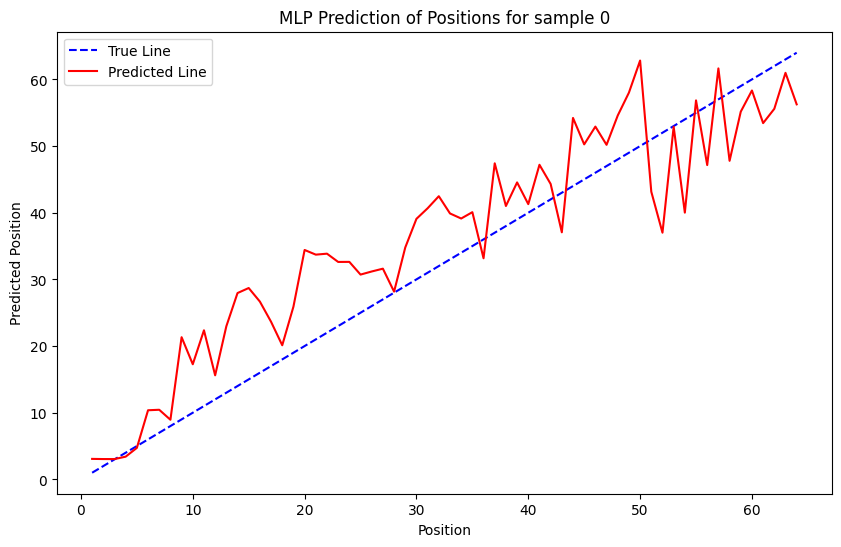

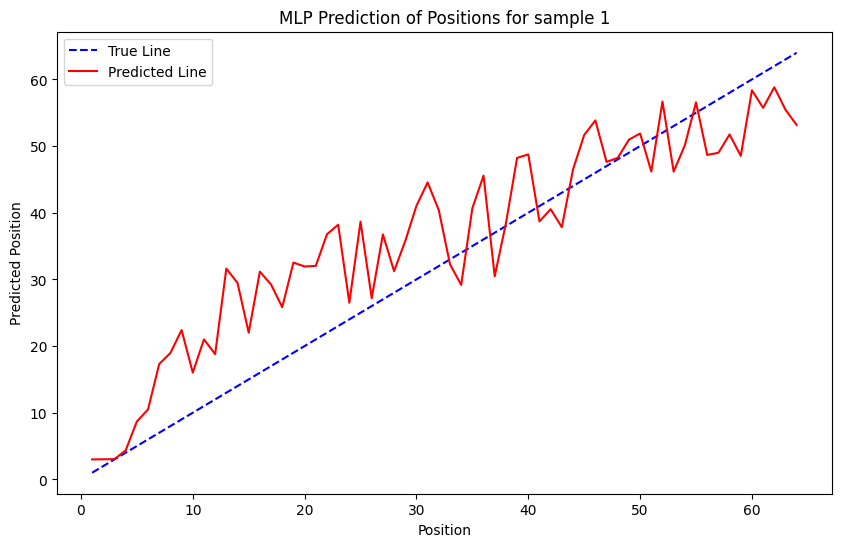

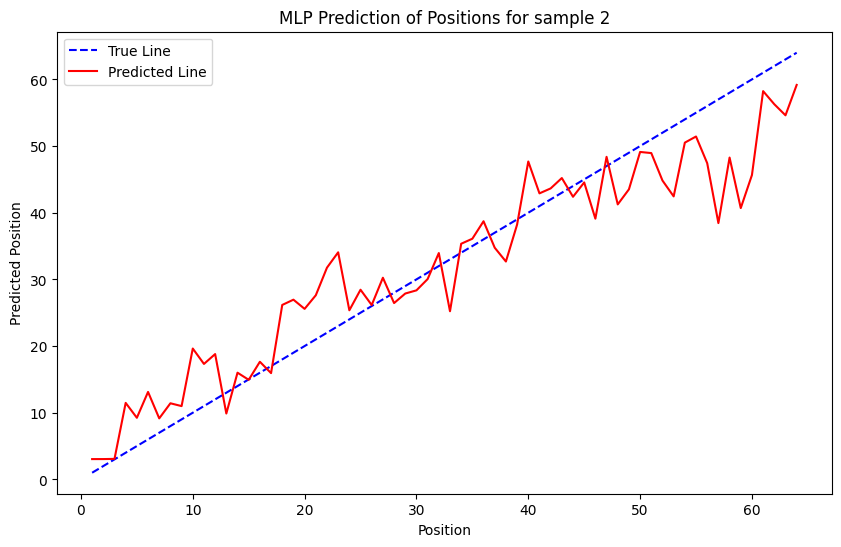

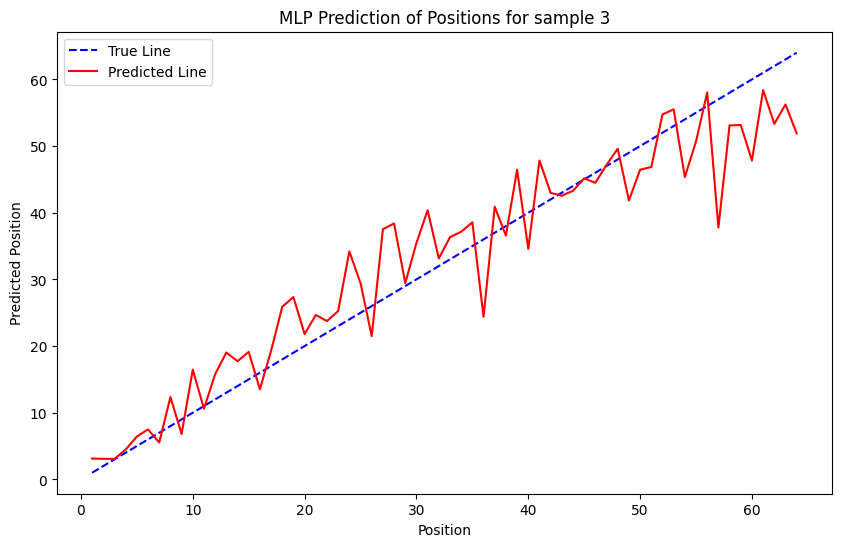

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm


# Define the MLP model
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP, self).__init__()
        self.hidden_layer = nn.Linear(input_size, hidden_size)
        self.output_layer = nn.Linear(hidden_size, output_size)
        self.relu = nn.ReLU()

    def forward(self, x):
        hidden = self.relu(self.hidden_layer(x))
        output = self.output_layer(hidden)
        return output

# ---------------- Improved Activation Statistics Plotting ----------------
def plot_activation_statistics_improved(act='blocks.0.ln2.hook_normalized', q=0.1, save_to_disk=False, output_dir="./plots_neurons"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    # Get activations with shape: (batch, ctx, neurons)
    train_activations = train_cache[act]
    train_activations = train_activations .cpu().numpy()

    test_activations = test_cache[act]
    test_activations = test_activations.cpu().numpy()

    num_samples, n_positions, n_neurons = train_activations.shape
    print("Train Activations shape:", train_activations.shape)
    print("Test Activations shape:", test_activations.shape)
    
    X = train_activations.reshape(-1, n_neurons)

    selected_neurons_ids = np.arange(n_neurons)

    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Prepare data for training
    range_vals = np.arange(1, n_positions + 1).reshape(-1, 1)  # Target line [1, 64]
    selected_activations = train_activations[:, :, selected_neurons_ids]
    X_train = selected_activations.reshape(-1, len(selected_neurons_ids))  # Shape: (num_samples * n_positions, len(selected_neurons_ids))
    Y_train = np.tile(range_vals, (num_samples, 1)).reshape(-1, 1)  # Shape: (num_samples * n_positions, 1)

    # Convert data to torch tensors
    X_train = torch.tensor(X_train, dtype=torch.float32).to(device)
    Y_train = torch.tensor(Y_train, dtype=torch.float32).to(device)

    # Define the MLP model
    input_size = len(selected_neurons_ids)
    hidden_size = 128  # You can adjust this
    output_size = 1
    model = MLP(input_size, hidden_size, output_size).to(device)

    # Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Train the MLP
    num_epochs = 10_000
    l1_lambda = 1
    for epoch in range(num_epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, Y_train)
        l1_penalty = l1_lambda * torch.sum(torch.abs(model.hidden_layer.weight))
        loss += l1_penalty
        loss.backward()
        optimizer.step()

        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}")

    # Predict the positions using the trained model
    for i in [0, 1, 2, 3]:
        # Extract activations for the selected neurons
        selected_activations = test_activations[i][:, selected_neurons_ids]
        X_test = torch.tensor(selected_activations, dtype=torch.float32).to(device)
        predicted_positions = model(X_test).detach().cpu().numpy()

        # Plot the true positions vs. predicted positions for the first sample
        if i in [0, 1, 2, 3]:
            plt.figure(figsize=(10, 6))
            plt.plot(range_vals, range_vals, label='True Line', color='blue', linestyle='--')
            plt.plot(range_vals, predicted_positions, label='Predicted Line', color='red')
            plt.xlabel('Position')
            plt.ylabel('Predicted Position')
            plt.title(f'MLP Prediction of Positions for sample {i}')
            plt.legend()

            if save_to_disk:
                plot_path = os.path.join(output_dir, f"mlp_q={q}_plot.png")
                plt.savefig(plot_path)
                print(f"Plot saved to {plot_path}")
            else:
                plt.show()

            plt.close()

    return model, selected_neurons_ids
# Example call:
model, seleceted_neurons_ids = plot_activation_statistics_improved(act='blocks.0.ln2.hook_normalized', q=0.25, save_to_disk=False, output_dir="activation_plots")

Using device: cuda
Train Activations shape: (10240, 64, 2048)
Test Activations shape: (100, 64, 2048)


Epoch [10/10000], Loss: 1362.1934
Epoch [20/10000], Loss: 1316.3990
Epoch [30/10000], Loss: 1264.6317
Epoch [40/10000], Loss: 1202.9602
Epoch [50/10000], Loss: 1128.7793
Epoch [60/10000], Loss: 1041.5311
Epoch [70/10000], Loss: 942.9085
Epoch [80/10000], Loss: 836.6743
Epoch [90/10000], Loss: 728.3118
Epoch [100/10000], Loss: 624.4783
Epoch [110/10000], Loss: 532.1461
Epoch [120/10000], Loss: 457.2568
Epoch [130/10000], Loss: 403.1083
Epoch [140/10000], Loss: 369.1855
Epoch [150/10000], Loss: 351.2585
Epoch [160/10000], Loss: 343.1855
Epoch [170/10000], Loss: 339.5278
Epoch [180/10000], Loss: 337.1295
Epoch [190/10000], Loss: 334.8553
Epoch [200/10000], Loss: 332.5177
Epoch [210/10000], Loss: 330.1474
Epoch [220/10000], Loss: 327.7646
Epoch [230/10000], Loss: 325.3707
Epoch [240/10000], Loss: 322.9684
Epoch [250/10000], Loss: 320.5657
Epoch [260/10000], Loss: 318.1746
Epoch [270/10000], Loss: 315.8068
Epoch [280/10000], Loss: 313.4736
Epoch [290/10000], Loss: 311.1844
Epoch [300/10000]

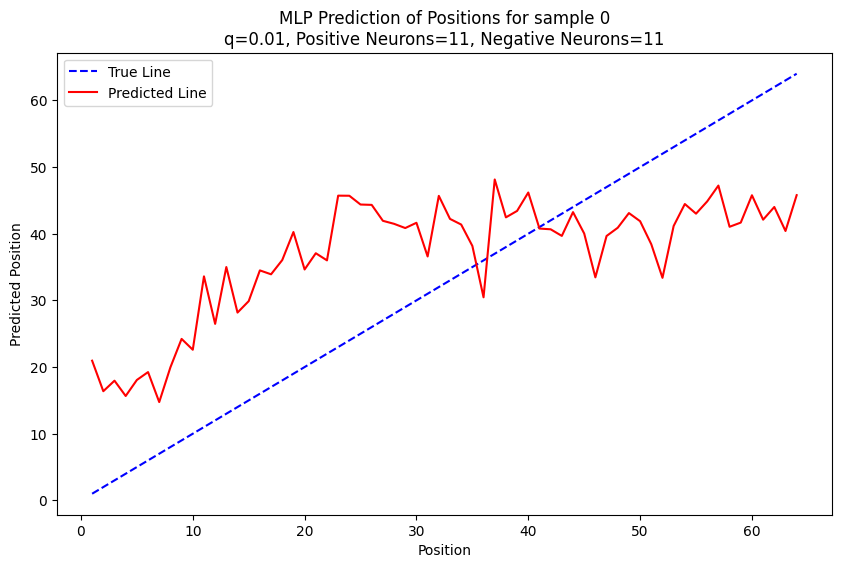

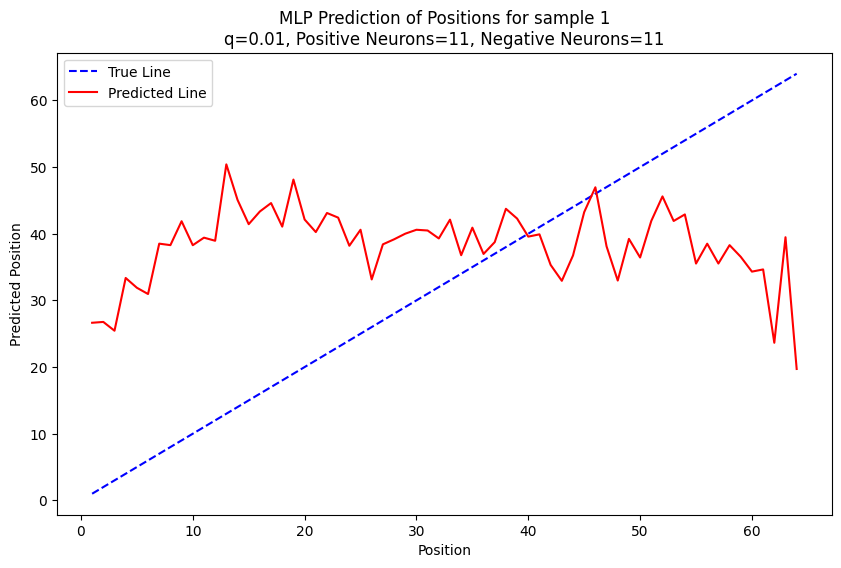

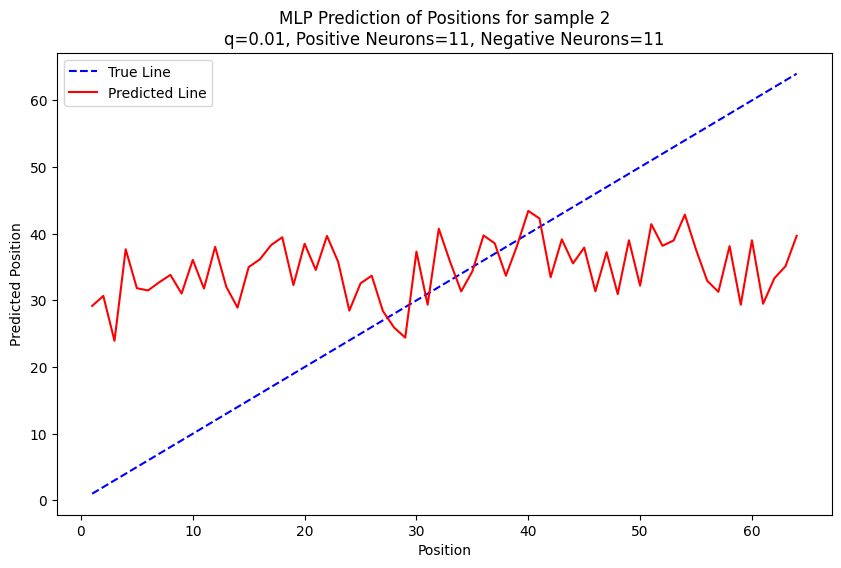

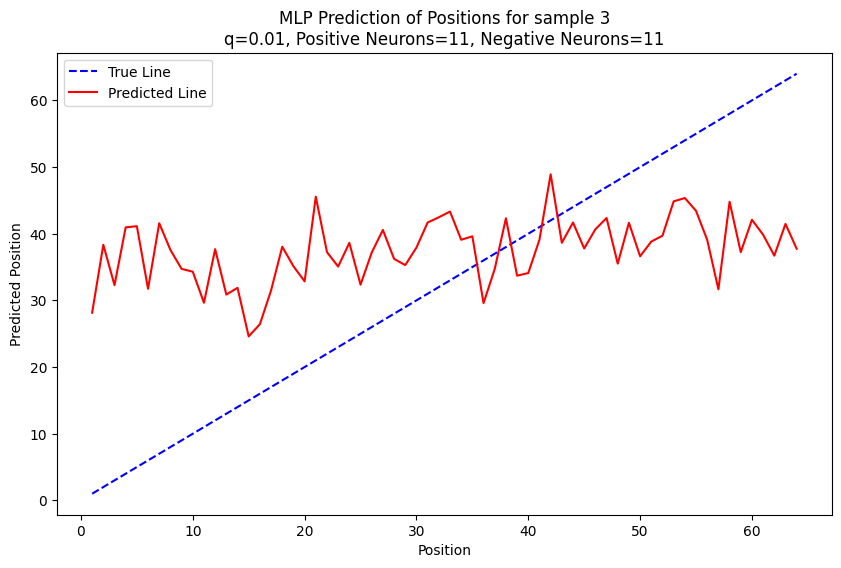

(MLP(
   (hidden_layer): Linear(in_features=22, out_features=128, bias=True)
   (output_layer): Linear(in_features=128, out_features=1, bias=True)
   (relu): ReLU()
 ),
 array([  32,  152,  341,  354,  416,  422,  463,  532,  932, 1022, 1679,
           0,  174,  343,  393,  702,  850, 1467, 1754, 1770, 1783, 1889]))

In [ ]:
plot_activation_statistics_improved(act='blocks.0.ln2.hook_normalized', q=0.01, save_to_disk=False, output_dir="activation_plots")

# Find best subgroup

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from itertools import combinations
from tqdm import tqdm

SAMPLE = None

# ---------------- Improved Activation Statistics Plotting ----------------
def plot_activation_statistics_improved(act='blocks.0.ln2.hook_normalized', q=0.1, save_to_disk=False, output_dir="./plots_neurons"):
    # Get activations with shape: (batch, ctx, neurons)
    activations = cache[act]
    # activations = activations[range(SAMPLE)]
    activations = activations.cpu().numpy()

    num_samples, n_positions, n_neurons = activations.shape
    print("Activations shape:", activations.shape)
    
    # Flatten (batch, ctx) to get X, and compute thresholds using the given quantiles.
    X = activations.reshape(-1, n_neurons)
    neurons_mean_val = X.mean(axis=0) 
    positive_neurons = neurons_mean_val[neurons_mean_val > 0]
    top_10_percent = np.quantile(positive_neurons, 1 - q)  # Returns a scalar
    avg_top10_neurons_mask = neurons_mean_val > top_10_percent
    avg_top10_neurons_ids = np.where(avg_top10_neurons_mask)[0] 

    # Create output directory if saving plots
    if save_to_disk and not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Initialize variables to track correlations
    subgroup_correlations = {}  # Dictionary to store correlations for each subgroup

    # Iterate over all subgroup sizes
    for r in tqdm(range(1, len(avg_top10_neurons_ids) + 1)):
        if r > 3 and r < len(avg_top10_neurons_ids) - 2:
            continue
        for subgroup in tqdm(combinations(avg_top10_neurons_ids, r)):  # Generate all combinations of size `r`
            subgroup = tuple(subgroup)  # Convert to tuple to use as a dictionary key
            subgroup_correlations[subgroup] = []  # Initialize list to store correlations for this subgroup

            # Calculate correlation for each sample
            for i in range(num_samples):
                subgroup_mean = activations[i][:, subgroup].mean(axis=1)  # Mean over all positions for this subgroup
                range_vals = np.arange(1, n_positions + 1)  # Range to correlate with
                corr = np.corrcoef(subgroup_mean, range_vals)[0, 1]
                subgroup_correlations[subgroup].append(corr)

    # Calculate the average correlation for each subgroup across all samples
    avg_correlations = {subgroup: np.mean(corrs) for subgroup, corrs in subgroup_correlations.items()}

    # Find the subgroup with the highest average correlation
    best_subgroup = max(avg_correlations, key=avg_correlations.get)
    best_avg_corr = avg_correlations[best_subgroup]

    print(f"Best subgroup: {best_subgroup}, Average correlation: {best_avg_corr}")

    # Plot the best subgroup for the first sample
    best_subgroup_mean = activations[0][:, best_subgroup].mean(axis=1)
    positions = np.arange(n_positions)
    plt.figure(figsize=(10, 6))
    plt.plot(positions, best_subgroup_mean, marker='^', label='Best Subgroup', color='green')
    plt.xlabel('Position')
    plt.ylabel('Activation Mean over neurons: {best_subgroup}')
    plt.title(f'Best Subgroup Correlation Plot (Average Corr: {best_avg_corr:.4f})')
    plt.legend()

    if save_to_disk:
        # Save the plot to disk
        plot_path = os.path.join(output_dir, f"best_subgroup_q={q}_plot.png")
        plt.savefig(plot_path)
        print(f"Plot saved to {plot_path}")
    else:
        # Show the plot
        plt.show()

    plt.close()

# Example call:
# plot_activation_statistics_improved(act='blocks.0.ln2.hook_normalized', q=0.03, save_to_disk=False, output_dir="activation_plots")

Activations shape: (10240, 64, 1024)


  0%|                                                   | 0/16 [00:00<?, ?it/s]

16it [00:12,  1.27it/s]
120it [01:35,  1.26it/s]                        | 1/16 [00:12<03:09, 12.61s/it]
560it [07:28,  1.25it/s]                        | 2/16 [01:48<14:19, 61.38s/it]
 19%|███████▉                                  | 3/16 [09:16<51:34, 238.02s/it]

In [ ]:
for i in [0.01,0.03,0.05,0.08,0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
    plot_activation_statistics_improved(act='blocks.0.ln2.hook_normalized', q=i,  save_to_disk=True, output_dir="./plots_neurons")
    print(i)
    print("Done")